In [1]:
import torch
from torchvision.transforms.functional import pil_to_tensor
from torchvision.utils import draw_segmentation_masks

from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

from data_utils import draw_images

In [2]:
device = torch.device('cuda')

img_processor = SegformerImageProcessor()

# load model from local trained and saved files
model = SegformerForSemanticSegmentation.from_pretrained('./tuned-segformer-epoch-30/')
model.to(device)


from torchvision.datasets import CocoDetection

# load our dataset with CocoDetection since images were exported from Label Studio in this format
dataset = CocoDetection(root="/home/ggeorge/datasets/DoorsTestDataset/images", annFile="/home/ggeorge/datasets/DoorsTestDataset/result_fixed.json")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


torch.Size([3, 4080, 3072]) torch.Size([3, 4080, 3072])


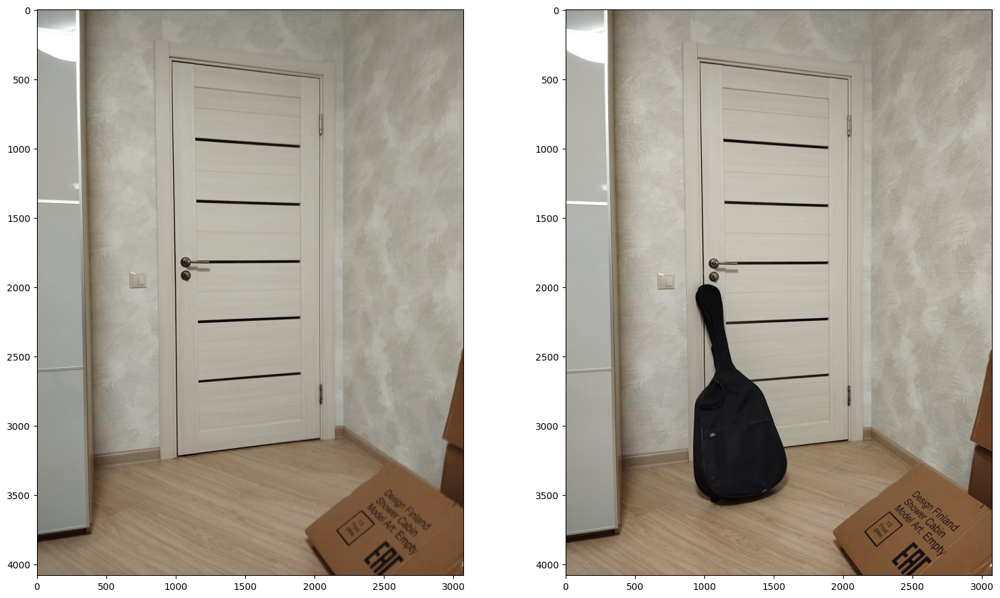

In [3]:
empty_door = pil_to_tensor(dataset[12][0])
non_empty = pil_to_tensor(dataset[8][0])

print(empty_door.size(), non_empty.size())

draw_images((empty_door, non_empty))

In [4]:
images = [empty_door, non_empty]
prep_images = []
masks = []
result_images = []


for img in images:
    preprocessed = img_processor(img, return_tensors="pt")
    prep_images.append(preprocessed.pixel_values.squeeze())

    pixel_values = preprocessed.pixel_values.to(device)

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values)

    pred_seg = img_processor.post_process_semantic_segmentation(outputs, target_sizes=[img.size()[-2:]])[0]
    pred_seg = pred_seg.cpu()
    masks.append(pred_seg)

    segmented = draw_segmentation_masks(img, pred_seg.to(torch.bool), colors='green')
    result_images.append(segmented)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.64].


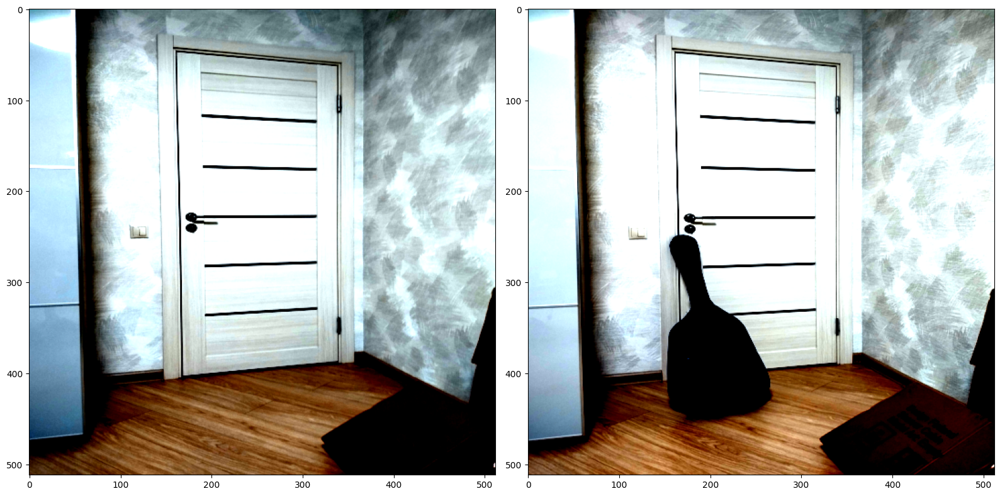

In [5]:
draw_images(prep_images)

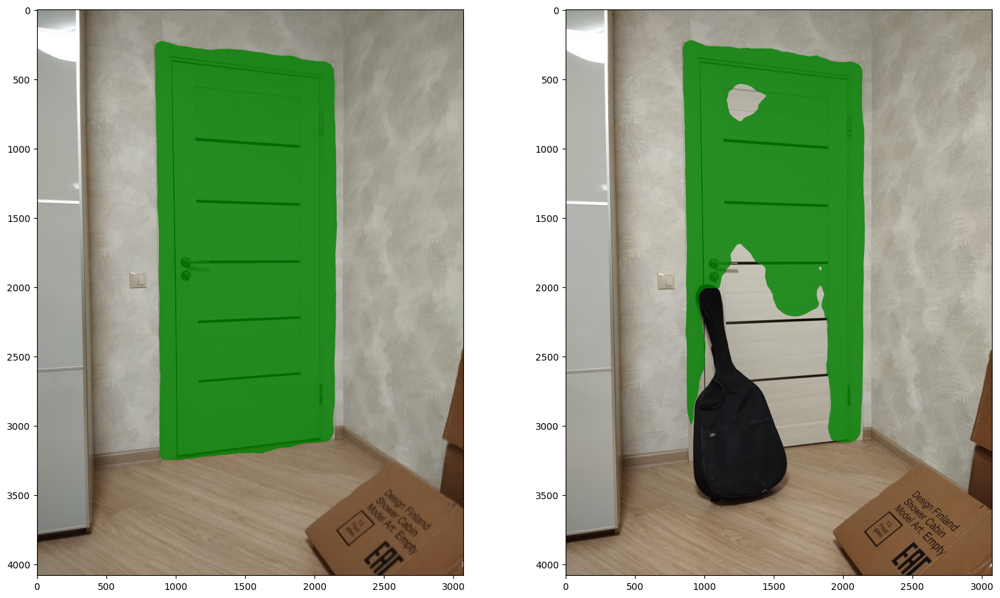

In [6]:
draw_images(result_images)

In [7]:
masks[0].unique()

tensor([0, 1])

In [8]:
masks[0].sum() 

tensor(3675938)

In [9]:
normal_area = masks[0].sum()
observed_area = masks[1].sum()

In [10]:
observed_area / normal_area

tensor(0.6799)

**будем говорить, что какой-то объект закрывает дверь, если отношение площадей (допустим) меньше $0.7$**

In [11]:
def segment_images(model, images):
    images  = map(pil_to_tensor, images)
    images_with_maps = []
    
    for img in images:
        preprocessed = img_processor(img, return_tensors="pt")
        pixel_values = preprocessed.pixel_values.to(device)
    
        with torch.no_grad():
            outputs = model(pixel_values=pixel_values)
    
        pred_seg = img_processor.post_process_semantic_segmentation(outputs, target_sizes=[img.size()[-2:]])[0]
        pred_seg = pred_seg.cpu()
    
        segmented = draw_segmentation_masks(img, pred_seg.to(torch.bool), colors='green', alpha=0.6)
        images_with_maps.append(segmented)

    draw_images(images_with_maps)

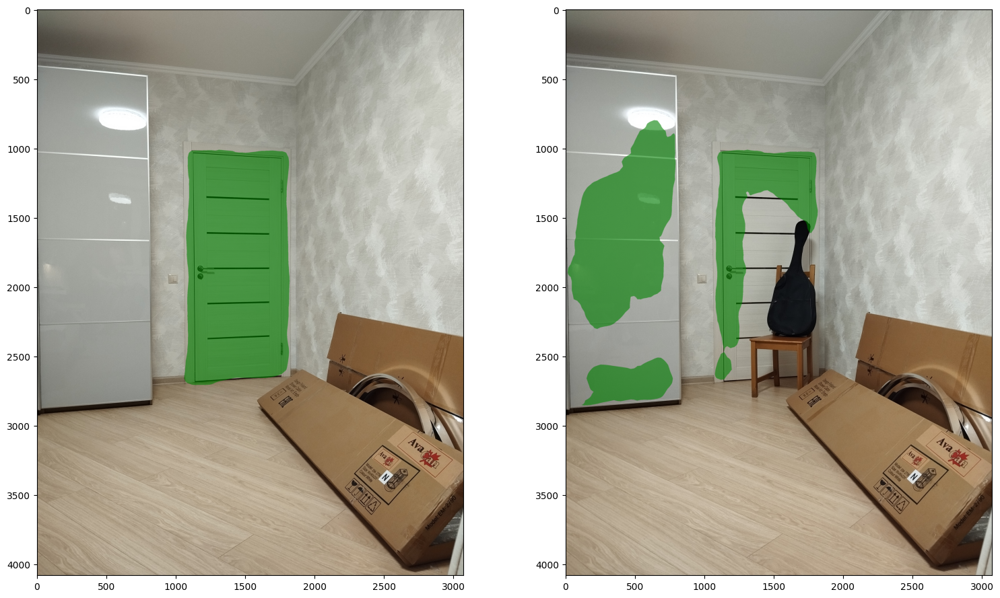

In [12]:
model = SegformerForSemanticSegmentation.from_pretrained('./tuned-segformer-epoch-10/')
model.to(device)

segment_images(model, (dataset[3][0], dataset[0][0]))

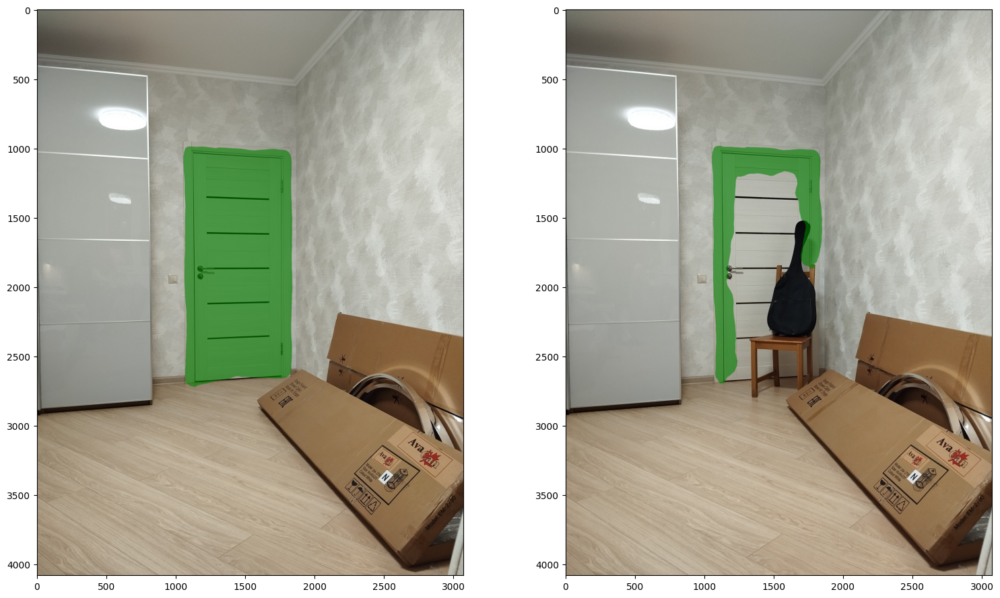

In [13]:
model = SegformerForSemanticSegmentation.from_pretrained('./tuned-segformer-epoch-35/')
model.to(device)

segment_images(model, (dataset[3][0], dataset[0][0]))

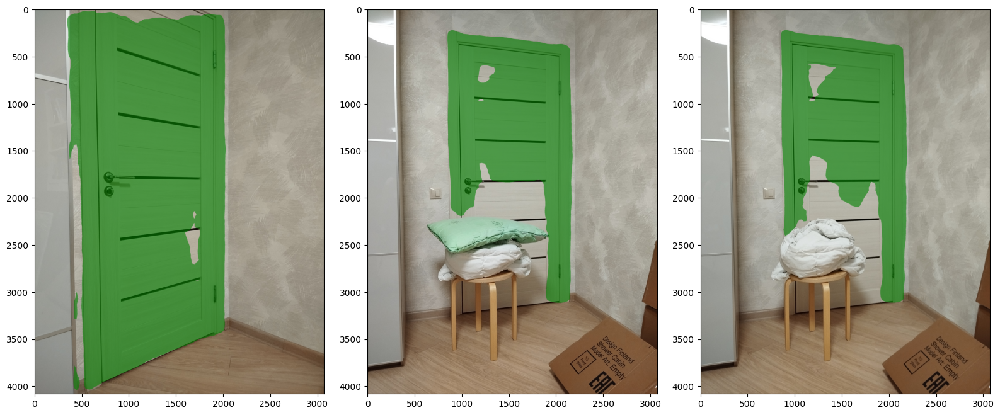

In [14]:
segment_images(model, (dataset[4][0], dataset[5][0], dataset[6][0],))

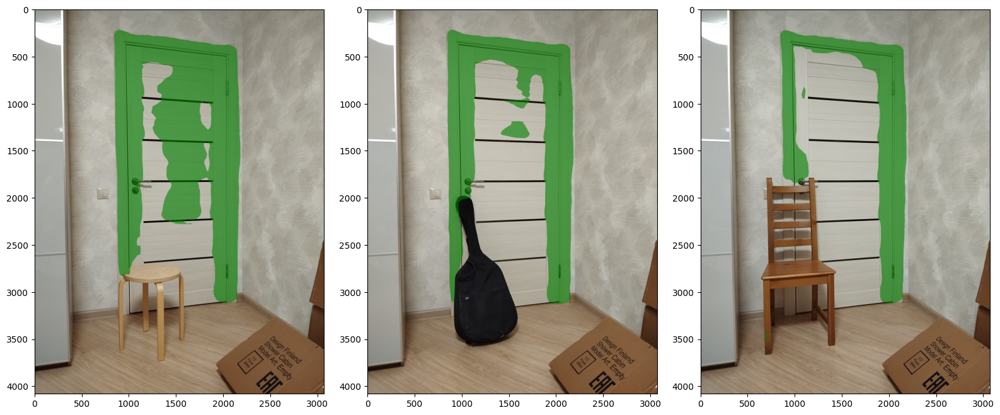

In [15]:
segment_images(model, (dataset[7][0], dataset[8][0], dataset[9][0],))

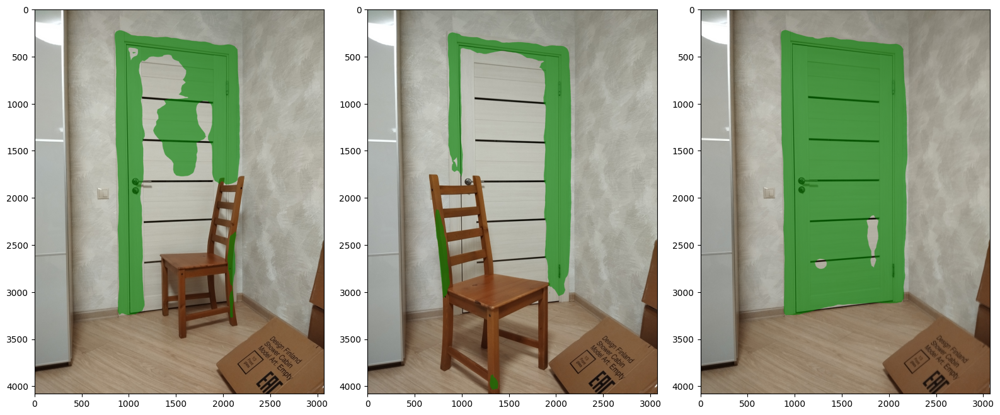

In [16]:
segment_images(model, (dataset[10][0], dataset[11][0], dataset[12][0],))